In [1]:
!pip install numpy pandas scikit-learn matplotlib seaborn requests tqdm opencv-python pillow kaleido -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 171.7 MB/s eta 0:00:0000:0100:01


In [2]:
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://download.pytorch.org/whl/cu113


In [3]:
import os
from tqdm import tqdm

import numpy as np
import pandas as pd

from PIL import Image

import torch
import torch.nn.functional as F
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda:0


In [4]:
from torchvision import transforms

train_transform = transforms.Compose([transforms.RandomResizedCrop(224),
                                      transforms.RandomHorizontalFlip(),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                     ])

test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

In [5]:
dataset_dir = 'Fruit-Project_split'
test_path = os.path.join(dataset_dir, 'val')
from torchvision import datasets
test_dataset = datasets.ImageFolder(test_path, test_transform)
print('Number-of-test-set', len(test_dataset))
print('Number-of-categories', len(test_dataset.classes))
print('Name-of-category', test_dataset.classes)

idx_to_labels = np.load('idx_to_labels.npy', allow_pickle=True).item()
classes = list(idx_to_labels.values())
print(classes)

Number-of-test-set 8764
Number-of-categories 44
Name-of-category ['alligator apple', 'apple', 'avocado', 'banana', 'barberry', 'bayberry', 'bell pepper', 'black berry', 'black cherry', 'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry', 'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian', 'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi', 'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange', 'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple', 'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato', 'watermelon', 'zucchini']
['alligator apple', 'apple', 'avocado', 'banana', 'barberry', 'bayberry', 'bell pepper', 'black berry', 'black cherry', 'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry', 'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian', 'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi', 'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange', 'papaya', 'pea', 'peanut', 'pear', 'per

In [11]:
from ensemble_model import WeightedEnsembleModel
import torch

model = torch.load('checkpoint/best-0.938.pth')

model = model.eval().to(device)




/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B7_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B7_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b7_lukemelas-dcc49843.pth" to /home/featurize/.cache/torch/hub/checkpoints/efficientnet_b7_lukemelas-dcc49843.pth
100%|██████████| 255M/255M [00:00<00:00, 384MB/s] 
/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments

In [12]:
test_dataset.imgs[:10]

[('Fruit-Project_split/val/alligator apple/0.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/1.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/104.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/11.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/126.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/129.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/13.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/146.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/147.jpg', 0),
 ('Fruit-Project_split/val/alligator apple/151.jpg', 0)]

In [13]:
img_paths = [each[0] for each in test_dataset.imgs]
df = pd.DataFrame()
df['image_path'] = img_paths
df['category_ID'] = test_dataset.targets
df['category_name'] = [idx_to_labels[ID] for ID in test_dataset.targets]

In [14]:
df

,image_path,category_ID,category_name
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple
...,...,...,...
8759,Fruit-Project_split/val/zucchini/972.jpg,43,zucchini
8760,Fruit-Project_split/val/zucchini/979.jpg,43,zucchini
8761,Fruit-Project_split/val/zucchini/99.jpg,43,zucchini
8762,Fruit-Project_split/val/zucchini/994.jpg,43,zucchini


In [15]:
n = 3
df_pred = pd.DataFrame()
for idx, row in tqdm(df.iterrows()):
    img_path = row['image_path']
    img_pil = Image.open(img_path).convert('RGB')
    input_img = test_transform(img_pil).unsqueeze(0).to(device)
    pred_logits = model(input_img) 
    pred_softmax = F.softmax(pred_logits, dim=1)

    pred_dict = {}

    top_n = torch.topk(pred_softmax, n) 
    pred_ids = top_n[1].cpu().detach().numpy().squeeze() 
    
    for i in range(1, n+1):
        pred_dict['top-{}-predID'.format(i)] = pred_ids[i-1]
        pred_dict['top-{}-predname'.format(i)] = idx_to_labels[pred_ids[i-1]]
    pred_dict['top-npred_accuracy'] = row['category_ID'] in pred_ids
    for idx, each in enumerate(classes):
        pred_dict['{}-pred_confidence'.format(each)] = pred_softmax[0][idx].cpu().detach().numpy()
        
    df_pred = pd.concat([df_pred, pd.DataFrame([pred_dict])], ignore_index=True)

8764it [10:15, 14.24it/s]


In [16]:
df_pred

,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,alligator apple-pred_confidence,apple-pred_confidence,avocado-pred_confidence,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,0,alligator apple,16,custard apple,31,papaya,True,0.9999999,3.767392e-12,1.3297136e-11,...,2.286143e-11,1.2773227e-11,3.745659e-13,7.30332e-11,8.737131e-14,5.7706253e-12,1.8937776e-13,5.283342e-14,6.682146e-14,2.1207604e-13
1,0,alligator apple,16,custard apple,34,pear,True,0.99999976,1.6591986e-10,6.402545e-10,...,4.6145065e-08,1.5498874e-12,2.940635e-13,3.643318e-10,2.2390125e-13,3.3888535e-14,4.8725206e-13,7.7981655e-14,2.3045717e-13,2.514113e-12
2,0,alligator apple,2,avocado,16,custard apple,True,0.9999808,2.34848e-09,1.5205706e-05,...,6.041791e-07,9.799085e-12,2.6039806e-10,1.0016198e-09,3.1711435e-12,2.9178153e-11,9.8900076e-11,8.9450695e-12,1.1786953e-10,5.691795e-10
3,31,papaya,29,mango,8,black cherry,False,0.04891735,0.0011192701,0.02140312,...,0.0018673546,1.5312758e-05,0.0007960316,0.019858912,5.3761174e-05,1.9272666e-05,0.0005118792,0.0031503274,0.004811282,0.00063896965
4,0,alligator apple,26,lime,28,macadamia,True,0.9994031,8.134287e-08,3.6998614e-07,...,5.7903344e-06,1.716318e-09,1.5926714e-10,2.0467624e-07,5.909728e-11,5.564119e-12,3.8529933e-11,5.8791715e-11,8.754678e-11,6.151657e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8759,43,zucchini,10,bottle gourd,6,bell pepper,True,3.9750296e-09,1.3108257e-09,5.3240623e-08,...,1.3044713e-08,1.3494603e-08,1.8179454e-08,1.6709465e-09,3.517486e-05,1.6656986e-06,3.7008707e-08,8.268812e-08,5.7841527e-07,0.93406147
8760,43,zucchini,10,bottle gourd,19,eggplant,True,5.71023e-09,1.0358875e-09,3.6069117e-08,...,4.099539e-09,3.8510393e-11,5.6997102e-08,1.6820881e-09,3.505586e-07,3.708591e-07,4.8135195e-07,1.2290046e-07,1.8813441e-06,0.9991478
8761,43,zucchini,10,bottle gourd,36,pineapple,True,8.1456236e-10,9.598793e-09,6.7819705e-08,...,1.8156988e-09,5.699984e-10,3.0819116e-05,4.1238066e-10,3.408071e-07,2.2178347e-07,2.3281508e-07,1.7094924e-07,8.3293787e-07,0.9998259
8762,43,zucchini,10,bottle gourd,19,eggplant,True,3.5553953e-09,3.2720304e-09,5.1536414e-08,...,2.8321127e-08,1.0364773e-11,1.08664535e-08,2.7472533e-10,3.4693306e-07,2.729576e-08,4.742618e-07,2.2559264e-07,1.0931728e-06,0.97873914


In [17]:
df = pd.concat([df, df_pred], axis=1)

In [18]:
df

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,16,custard apple,31,papaya,True,...,2.286143e-11,1.2773227e-11,3.745659e-13,7.30332e-11,8.737131e-14,5.7706253e-12,1.8937776e-13,5.283342e-14,6.682146e-14,2.1207604e-13
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,16,custard apple,34,pear,True,...,4.6145065e-08,1.5498874e-12,2.940635e-13,3.643318e-10,2.2390125e-13,3.3888535e-14,4.8725206e-13,7.7981655e-14,2.3045717e-13,2.514113e-12
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,2,avocado,16,custard apple,True,...,6.041791e-07,9.799085e-12,2.6039806e-10,1.0016198e-09,3.1711435e-12,2.9178153e-11,9.8900076e-11,8.9450695e-12,1.1786953e-10,5.691795e-10
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,31,papaya,29,mango,8,black cherry,False,...,0.0018673546,1.5312758e-05,0.0007960316,0.019858912,5.3761174e-05,1.9272666e-05,0.0005118792,0.0031503274,0.004811282,0.00063896965
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,26,lime,28,macadamia,True,...,5.7903344e-06,1.716318e-09,1.5926714e-10,2.0467624e-07,5.909728e-11,5.564119e-12,3.8529933e-11,5.8791715e-11,8.754678e-11,6.151657e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8759,Fruit-Project_split/val/zucchini/972.jpg,43,zucchini,43,zucchini,10,bottle gourd,6,bell pepper,True,...,1.3044713e-08,1.3494603e-08,1.8179454e-08,1.6709465e-09,3.517486e-05,1.6656986e-06,3.7008707e-08,8.268812e-08,5.7841527e-07,0.93406147
8760,Fruit-Project_split/val/zucchini/979.jpg,43,zucchini,43,zucchini,10,bottle gourd,19,eggplant,True,...,4.099539e-09,3.8510393e-11,5.6997102e-08,1.6820881e-09,3.505586e-07,3.708591e-07,4.8135195e-07,1.2290046e-07,1.8813441e-06,0.9991478
8761,Fruit-Project_split/val/zucchini/99.jpg,43,zucchini,43,zucchini,10,bottle gourd,36,pineapple,True,...,1.8156988e-09,5.699984e-10,3.0819116e-05,4.1238066e-10,3.408071e-07,2.2178347e-07,2.3281508e-07,1.7094924e-07,8.3293787e-07,0.9998259
8762,Fruit-Project_split/val/zucchini/994.jpg,43,zucchini,43,zucchini,10,bottle gourd,19,eggplant,True,...,2.8321127e-08,1.0364773e-11,1.08664535e-08,2.7472533e-10,3.4693306e-07,2.729576e-08,4.742618e-07,2.2559264e-07,1.0931728e-06,0.97873914


In [19]:
df.to_csv('predict result.csv', index=False)

In [20]:
import pandas as pd
import numpy as np
from tqdm import tqdm

In [21]:
idx_to_labels = np.load('idx_to_labels.npy', allow_pickle=True).item()
classes = list(idx_to_labels.values())
print(classes)

['alligator apple', 'apple', 'avocado', 'banana', 'barberry', 'bayberry', 'bell pepper', 'black berry', 'black cherry', 'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry', 'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian', 'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi', 'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange', 'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple', 'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato', 'watermelon', 'zucchini']


In [22]:
df = pd.read_csv('predict result.csv')
df

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,16,custard apple,31,papaya,True,...,2.286143e-11,1.277323e-11,3.745659e-13,7.303320e-11,8.737131e-14,5.770625e-12,1.893778e-13,5.283342e-14,6.682146e-14,2.120760e-13
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,16,custard apple,34,pear,True,...,4.614506e-08,1.549887e-12,2.940635e-13,3.643318e-10,2.239012e-13,3.388853e-14,4.872521e-13,7.798165e-14,2.304572e-13,2.514113e-12
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,2,avocado,16,custard apple,True,...,6.041791e-07,9.799085e-12,2.603981e-10,1.001620e-09,3.171144e-12,2.917815e-11,9.890008e-11,8.945069e-12,1.178695e-10,5.691795e-10
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,31,papaya,29,mango,8,black cherry,False,...,1.867355e-03,1.531276e-05,7.960316e-04,1.985891e-02,5.376117e-05,1.927267e-05,5.118792e-04,3.150327e-03,4.811282e-03,6.389696e-04
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,26,lime,28,macadamia,True,...,5.790334e-06,1.716318e-09,1.592671e-10,2.046762e-07,5.909728e-11,5.564119e-12,3.852993e-11,5.879171e-11,8.754678e-11,6.151657e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8759,Fruit-Project_split/val/zucchini/972.jpg,43,zucchini,43,zucchini,10,bottle gourd,6,bell pepper,True,...,1.304471e-08,1.349460e-08,1.817945e-08,1.670947e-09,3.517486e-05,1.665699e-06,3.700871e-08,8.268812e-08,5.784153e-07,9.340615e-01
8760,Fruit-Project_split/val/zucchini/979.jpg,43,zucchini,43,zucchini,10,bottle gourd,19,eggplant,True,...,4.099539e-09,3.851039e-11,5.699710e-08,1.682088e-09,3.505586e-07,3.708591e-07,4.813520e-07,1.229005e-07,1.881344e-06,9.991478e-01
8761,Fruit-Project_split/val/zucchini/99.jpg,43,zucchini,43,zucchini,10,bottle gourd,36,pineapple,True,...,1.815699e-09,5.699984e-10,3.081912e-05,4.123807e-10,3.408071e-07,2.217835e-07,2.328151e-07,1.709492e-07,8.329379e-07,9.998259e-01
8762,Fruit-Project_split/val/zucchini/994.jpg,43,zucchini,43,zucchini,10,bottle gourd,19,eggplant,True,...,2.832113e-08,1.036477e-11,1.086645e-08,2.747253e-10,3.469331e-07,2.729576e-08,4.742618e-07,2.255926e-07,1.093173e-06,9.787391e-01


In [23]:
sum(df['category_name'] == df['top-1-predname']) / len(df)

0.9609767229575537

In [24]:
sum(df['top-npred_accuracy']) / len(df)

0.9893884071200365

In [25]:
from sklearn.metrics import classification_report
print(classification_report(df['category_name'], df['top-1-predname'], target_names=classes))

                 precision    recall  f1-score   support

alligator apple       0.90      0.90      0.90       175
          apple       0.96      0.94      0.95       240
        avocado       0.96      0.96      0.96       233
         banana       0.98      0.98      0.98       232
       barberry       0.97      0.98      0.97       207
       bayberry       0.98      0.96      0.97       199
    bell pepper       0.95      0.95      0.95       200
    black berry       0.97      0.99      0.98       225
   black cherry       0.91      0.85      0.88       185
      blueberry       0.95      0.98      0.97       200
   bottle gourd       0.96      0.92      0.94       199
     cantaloupe       0.96      0.99      0.97       201
      carambola       0.98      0.99      0.98       201
         cherry       0.89      0.90      0.90       200
        coconut       0.99      0.97      0.98       204
    corn kernel       0.99      0.98      0.98       203
  custard apple       0.95    

In [26]:
report = classification_report(df['category_name'], df['top-1-predname'], target_names=classes, output_dict=True)
del report['accuracy']
df_report = pd.DataFrame(report).transpose()
df_report

,precision,recall,f1-score,support
alligator apple,0.897143,0.897143,0.897143,175.0
apple,0.957447,0.937500,0.947368,240.0
avocado,0.961207,0.957082,0.959140,233.0
banana,0.982759,0.982759,0.982759,232.0
barberry,0.966507,0.975845,0.971154,207.0
bayberry,0.979592,0.964824,0.972152,199.0
bell pepper,0.954774,0.950000,0.952381,200.0
black berry,0.969565,0.991111,0.980220,225.0
black cherry,0.907514,0.848649,0.877095,185.0
blueberry,0.951456,0.980000,0.965517,200.0


In [27]:
accuracy_list = []
for fruit in tqdm(classes):
    df_temp = df[df['category_name']==fruit]
    accuracy = sum(df_temp['category_name'] == df_temp['top-1-predname']) / len(df_temp)
    accuracy_list.append(accuracy)

100%|██████████| 44/44 [00:00<00:00, 771.69it/s]


In [28]:
acc_macro = np.mean(accuracy_list)
acc_weighted = sum(accuracy_list * df_report.iloc[:-2]['support'] / len(df))

accuracy_list.append(acc_macro)
accuracy_list.append(acc_weighted)

df_report['accuracy'] = accuracy_list

In [29]:
df_report

,precision,recall,f1-score,support,accuracy
alligator apple,0.897143,0.897143,0.897143,175.0,0.897143
apple,0.957447,0.937500,0.947368,240.0,0.937500
avocado,0.961207,0.957082,0.959140,233.0,0.957082
banana,0.982759,0.982759,0.982759,232.0,0.982759
barberry,0.966507,0.975845,0.971154,207.0,0.975845
bayberry,0.979592,0.964824,0.972152,199.0,0.964824
bell pepper,0.954774,0.950000,0.952381,200.0,0.950000
black berry,0.969565,0.991111,0.980220,225.0,0.991111
black cherry,0.907514,0.848649,0.877095,185.0,0.848649
blueberry,0.951456,0.980000,0.965517,200.0,0.980000


In [30]:
df_report.to_csv('Accuracy by category.csv', index_label='category')

In [31]:
import pandas as pd
import numpy as np
from tqdm import tqdm

import math
import cv2

import matplotlib.pyplot as plt
%matplotlib inline

In [32]:
idx_to_labels = np.load('idx_to_labels.npy', allow_pickle=True).item()

classes = list(idx_to_labels.values())
print(classes)

['alligator apple', 'apple', 'avocado', 'banana', 'barberry', 'bayberry', 'bell pepper', 'black berry', 'black cherry', 'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry', 'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian', 'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi', 'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange', 'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple', 'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato', 'watermelon', 'zucchini']


In [33]:
df = pd.read_csv('predict result.csv')
df.head()

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,16,custard apple,31,papaya,True,...,2.286143e-11,1.277323e-11,3.745659e-13,7.303320e-11,8.737131e-14,5.770625e-12,1.893778e-13,5.283342e-14,6.682146e-14,2.120760e-13
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,16,custard apple,34,pear,True,...,4.614506e-08,1.549887e-12,2.940635e-13,3.643318e-10,2.239012e-13,3.388853e-14,4.872521e-13,7.798165e-14,2.304572e-13,2.514113e-12
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,2,avocado,16,custard apple,True,...,6.041791e-07,9.799085e-12,2.603981e-10,1.001620e-09,3.171144e-12,2.917815e-11,9.890008e-11,8.945069e-12,1.178695e-10,5.691795e-10
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,31,papaya,29,mango,8,black cherry,False,...,1.867355e-03,1.531276e-05,7.960316e-04,1.985891e-02,5.376117e-05,1.927267e-05,5.118792e-04,3.150327e-03,4.811282e-03,6.389696e-04
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,26,lime,28,macadamia,True,...,5.790334e-06,1.716318e-09,1.592671e-10,2.046762e-07,5.909728e-11,5.564119e-12,3.852993e-11,5.879171e-11,8.754678e-11,6.151657e-10


In [34]:
from sklearn.metrics import confusion_matrix
confusion_matrix_model = confusion_matrix(df['category_name'], df['top-1-predname'])
confusion_matrix_model.shape

(44, 44)

In [35]:
confusion_matrix_model

array([[157,   0,   0, ...,   0,   0,   0],
       [  2, 225,   0, ...,   1,   0,   0],
       [  0,   0, 223, ...,   0,   0,   1],
       ...,
       [  0,   2,   0, ..., 191,   0,   0],
       [  0,   0,   0, ...,   0, 199,   0],
       [  0,   0,   0, ...,   0,   0, 196]])

In [36]:
import itertools
def cnf_matrix_plotter(cm, classes, cmap=plt.cm.Blues):
 
    plt.figure(figsize=(15, 14))
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar() 
    tick_marks = np.arange(len(classes))
    
    plt.title('confusion matrix', fontsize=30)
    plt.xlabel('Forecast category', fontsize=25, c='r')
    plt.ylabel('true category', fontsize=25, c='r')
    plt.tick_params(labelsize=14) 
    plt.xticks(tick_marks, classes, rotation=75) 
    plt.yticks(tick_marks, classes)
    
    threshold = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > threshold else "black",
                 fontsize=12)

    plt.tight_layout()

    plt.savefig('confusion matrix.pdf', dpi=600) 
    plt.show()

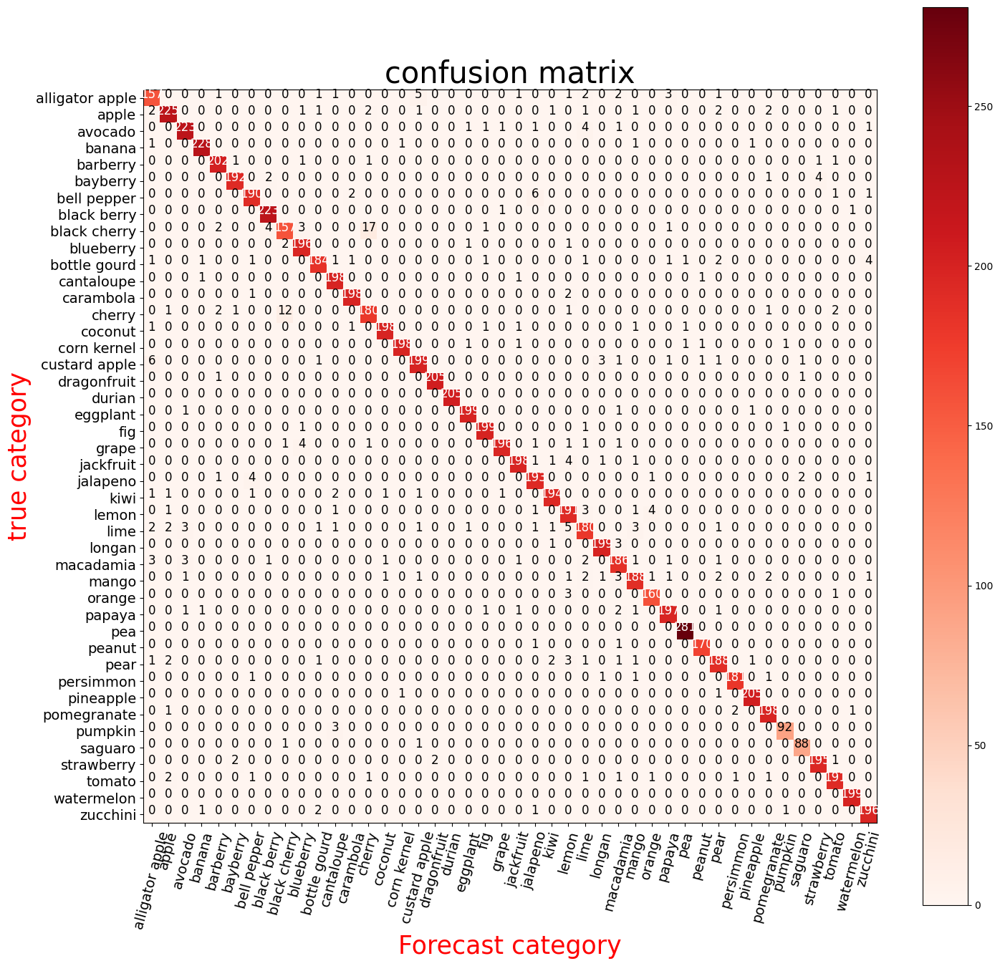

In [37]:
cnf_matrix_plotter(confusion_matrix_model, classes, cmap='Reds')

In [38]:
true_A = 'cherry'
pred_B = 'black cherry'

In [39]:
wrong_df = df[(df['category_name']==true_A)&(df['top-1-predname']==pred_B)]
wrong_df

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
2697,Fruit-Project_split/val/cherry/106.jpg,13,cherry,8,black cherry,13,cherry,4,barberry,True,...,9.107008e-09,3.108294e-09,1.836510e-09,4.344966e-07,2.735786e-10,2.622905e-08,1.559677e-08,6.302484e-08,7.429391e-10,9.066479e-11
2705,Fruit-Project_split/val/cherry/139.jpg,13,cherry,8,black cherry,13,cherry,27,longan,True,...,4.058038e-07,3.463557e-09,2.112341e-09,2.885380e-08,7.986876e-11,2.295686e-09,4.017845e-08,5.209135e-08,7.749294e-09,2.457111e-10
2717,Fruit-Project_split/val/cherry/2.jpg,13,cherry,8,black cherry,13,cherry,20,fig,True,...,2.487332e-07,3.031786e-08,9.213558e-09,7.415586e-08,5.201226e-10,6.547082e-07,2.528282e-08,1.835294e-08,1.455855e-08,2.714831e-08
2737,Fruit-Project_split/val/cherry/29.jpg,13,cherry,8,black cherry,13,cherry,0,alligator apple,True,...,2.345442e-12,4.962459e-16,5.960420e-15,6.183242e-14,2.856002e-16,1.150475e-14,1.025735e-16,2.382560e-15,1.768280e-15,1.383134e-15
2738,Fruit-Project_split/val/cherry/290.jpg,13,cherry,8,black cherry,13,cherry,40,strawberry,True,...,5.029162e-06,1.290597e-05,1.078876e-05,6.703443e-06,1.532643e-06,5.312642e-04,2.235601e-03,1.351148e-03,2.421137e-04,1.094869e-06
2753,Fruit-Project_split/val/cherry/358.jpg,13,cherry,8,black cherry,13,cherry,21,grape,True,...,5.253616e-06,1.674567e-08,1.907264e-07,1.365895e-07,6.293166e-08,3.395791e-07,2.322671e-07,5.327848e-07,1.730031e-07,2.173048e-08
2755,Fruit-Project_split/val/cherry/363.jpg,13,cherry,8,black cherry,13,cherry,5,bayberry,True,...,1.921647e-07,1.916991e-07,2.759019e-09,2.040424e-08,6.966212e-10,7.043228e-08,5.862833e-08,2.013044e-08,1.020965e-08,1.073048e-09
2791,Fruit-Project_split/val/cherry/502.jpg,13,cherry,8,black cherry,13,cherry,37,pomegranate,True,...,2.118764e-05,1.672183e-05,1.466095e-06,1.348193e-01,2.142289e-06,3.322088e-02,3.715502e-05,1.464921e-04,3.496280e-06,4.551827e-08
2822,Fruit-Project_split/val/cherry/631.jpg,13,cherry,8,black cherry,13,cherry,20,fig,True,...,2.425871e-06,1.435212e-07,2.362468e-07,4.732000e-05,5.891537e-08,2.281416e-06,3.588091e-07,4.865326e-06,1.336647e-07,8.246349e-07
2830,Fruit-Project_split/val/cherry/692.jpg,13,cherry,8,black cherry,13,cherry,7,black berry,True,...,3.667100e-06,9.427440e-08,5.841775e-08,2.035283e-07,5.737730e-08,1.995504e-07,5.158208e-07,2.968116e-07,5.818455e-08,1.176165e-08


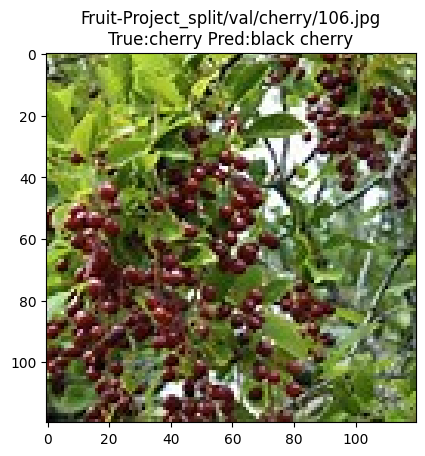

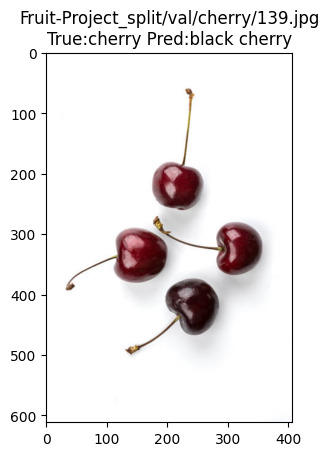

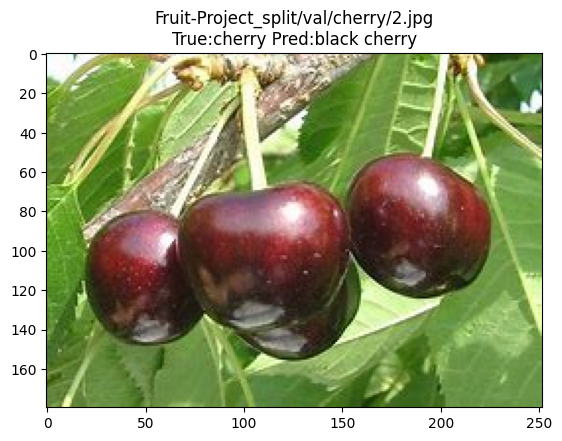

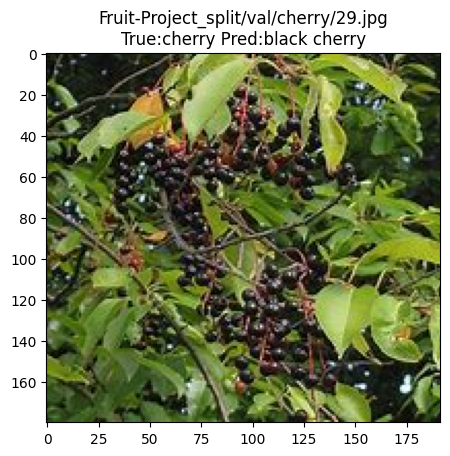

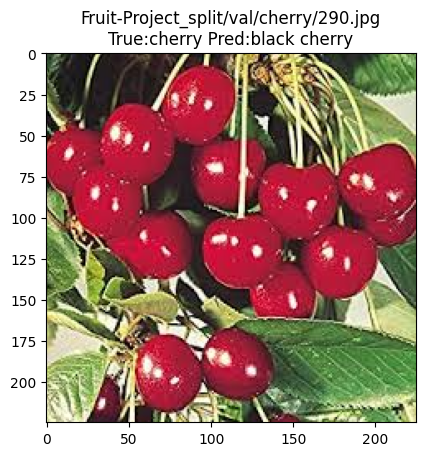

...

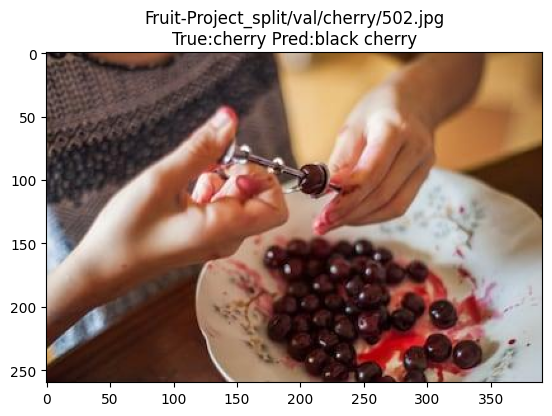

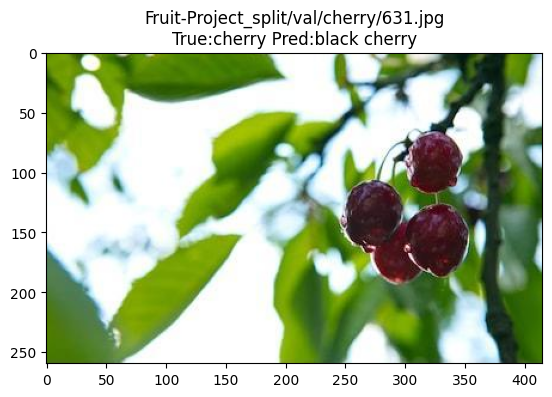

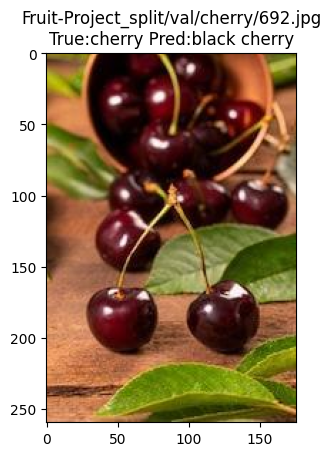

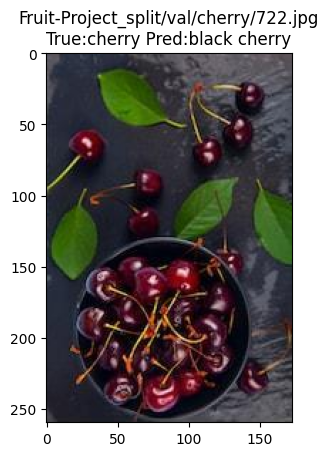

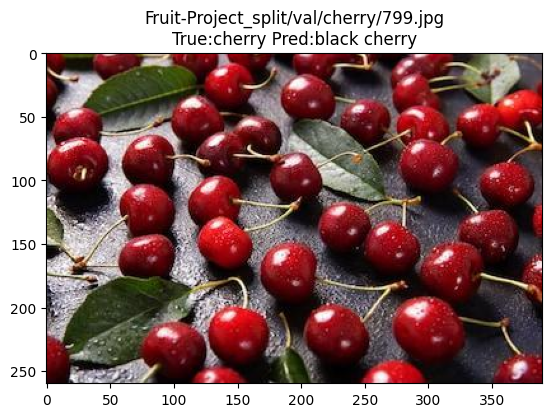

In [40]:
for idx, row in wrong_df.iterrows():
    img_path = row['image_path']
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    title_str = img_path + '\nTrue:' + row['category_name'] + ' Pred:' + row['top-1-predname']
    plt.title(title_str)
    plt.show()

In [41]:
true_A = 'black cherry'
pred_B = 'cherry'

In [42]:
wrong_df = df[(df['category_name']==true_A)&(df['top-1-predname']==pred_B)]
wrong_df

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
1714,Fruit-Project_split/val/black cherry/109.jpg,8,black cherry,13,cherry,8,black cherry,20,fig,True,...,3.429111e-06,3.184032e-07,2.058765e-07,3.298128e-07,4.639732e-08,6.930337e-06,5.052729e-06,1.109202e-05,6.002098e-07,1.218172e-06
1720,Fruit-Project_split/val/black cherry/123.jpg,8,black cherry,13,cherry,8,black cherry,21,grape,True,...,3.344386e-06,2.182247e-07,9.520467e-08,3.622840e-06,1.404968e-08,3.118322e-06,5.427970e-07,2.385269e-07,8.904679e-10,1.077802e-08
1721,Fruit-Project_split/val/black cherry/132.jpg,8,black cherry,13,cherry,8,black cherry,19,eggplant,True,...,8.206004e-07,3.765004e-08,2.622873e-08,3.958994e-07,6.363571e-09,9.957058e-07,2.636898e-06,2.567877e-06,3.925481e-09,2.148938e-07
1734,Fruit-Project_split/val/black cherry/227.jpg,8,black cherry,13,cherry,8,black cherry,19,eggplant,True,...,2.533069e-07,4.504133e-08,1.093463e-08,2.193766e-08,2.885449e-09,8.129242e-08,2.615130e-07,6.303883e-08,4.574624e-09,1.431963e-09
1737,Fruit-Project_split/val/black cherry/234.jpg,8,black cherry,13,cherry,8,black cherry,4,barberry,True,...,8.735260e-06,2.243760e-06,2.055282e-06,5.124410e-04,6.584953e-08,5.939589e-06,5.266685e-05,8.362311e-05,2.814171e-06,3.024669e-06
1741,Fruit-Project_split/val/black cherry/249.jpg,8,black cherry,13,cherry,8,black cherry,5,bayberry,True,...,1.234245e-05,4.500699e-07,1.948527e-07,7.993188e-07,8.815218e-09,1.523256e-07,1.014819e-06,2.694453e-07,1.040835e-07,5.873997e-08
1742,Fruit-Project_split/val/black cherry/251.jpg,8,black cherry,13,cherry,8,black cherry,19,eggplant,True,...,1.428168e-06,3.350891e-08,2.883102e-07,1.063545e-07,1.512426e-08,3.851673e-06,1.226627e-06,2.043703e-06,8.288285e-08,4.019027e-07
1744,Fruit-Project_split/val/black cherry/255.jpg,8,black cherry,13,cherry,8,black cherry,21,grape,True,...,1.183436e-07,6.155194e-08,5.232641e-08,3.618054e-07,1.935875e-09,2.520370e-07,3.313534e-06,2.866813e-06,4.274375e-08,1.240356e-08
1745,Fruit-Project_split/val/black cherry/257.jpg,8,black cherry,13,cherry,8,black cherry,4,barberry,True,...,1.897016e-07,4.123704e-08,4.662199e-09,6.228989e-08,2.221310e-09,4.234212e-08,3.254751e-06,2.712006e-07,1.528256e-09,1.527871e-09
1746,Fruit-Project_split/val/black cherry/258.jpg,8,black cherry,13,cherry,8,black cherry,21,grape,True,...,5.927013e-08,8.536075e-09,2.029458e-08,1.118874e-08,1.747084e-09,2.812870e-07,6.746818e-07,1.315645e-07,5.658685e-09,4.465104e-10


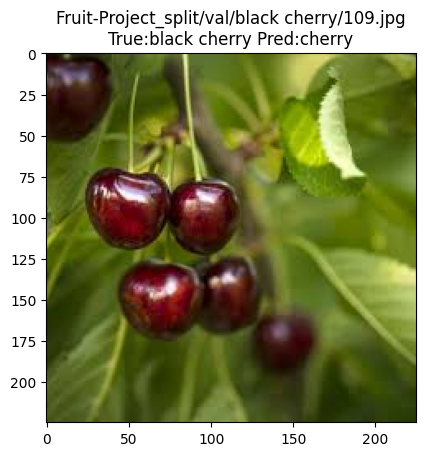

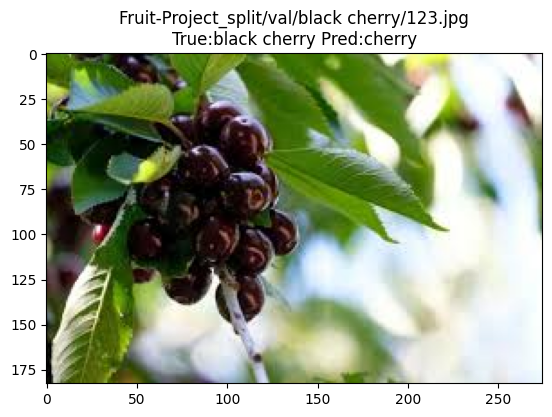

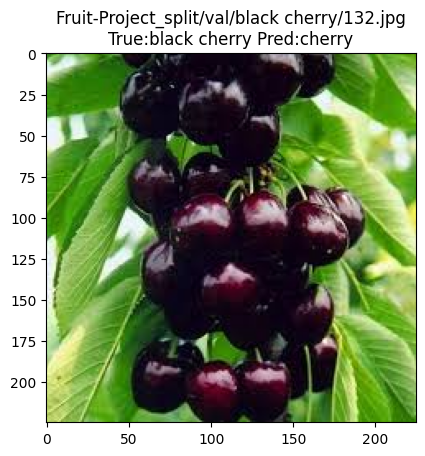

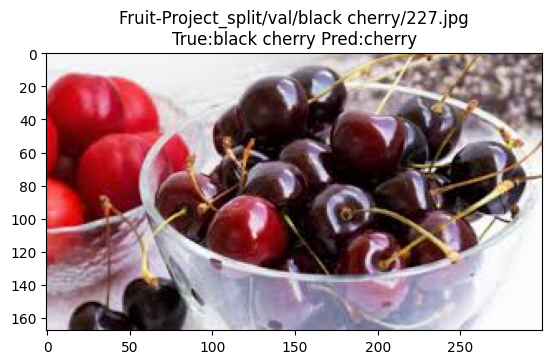

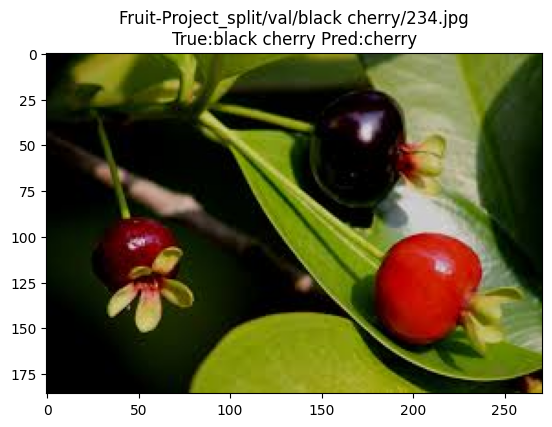

...

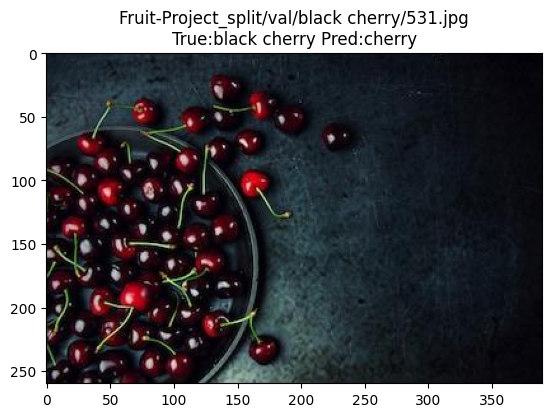

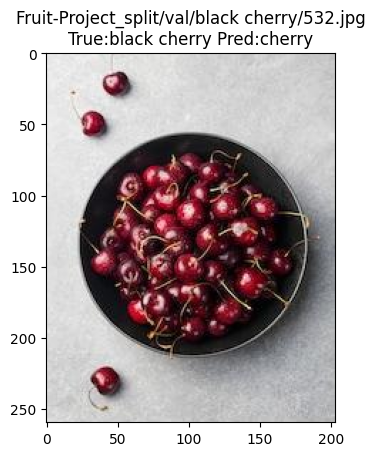

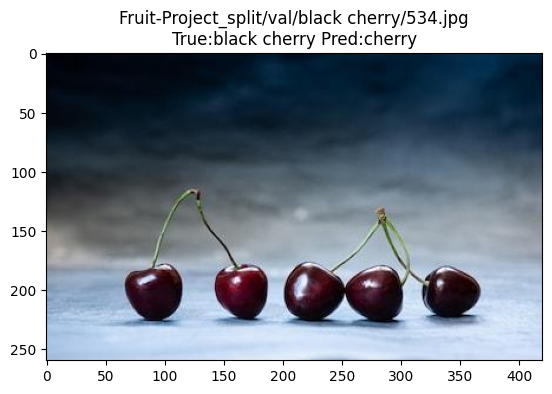

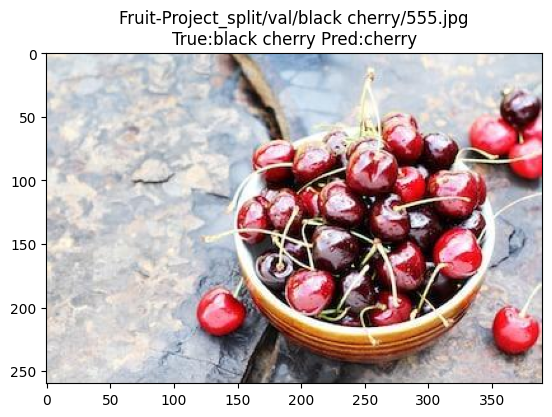

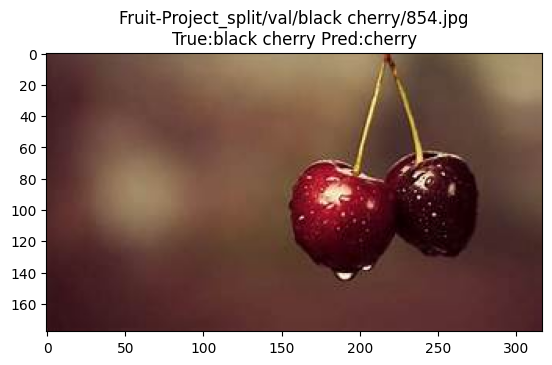

In [43]:
for idx, row in wrong_df.iterrows():
    img_path = row['image_path']
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    title_str = img_path + '\nTrue:' + row['category_name'] + ' Pred:' + row['top-1-predname']
    plt.title(title_str)
    plt.show()

In [44]:
idx_to_labels = np.load('idx_to_labels.npy', allow_pickle=True).item()
classes = list(idx_to_labels.values())
print(classes)

['alligator apple', 'apple', 'avocado', 'banana', 'barberry', 'bayberry', 'bell pepper', 'black berry', 'black cherry', 'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry', 'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian', 'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi', 'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange', 'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple', 'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato', 'watermelon', 'zucchini']


In [45]:
df = pd.read_csv('predict result.csv')
df.head()

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,16,custard apple,31,papaya,True,...,2.286143e-11,1.277323e-11,3.745659e-13,7.303320e-11,8.737131e-14,5.770625e-12,1.893778e-13,5.283342e-14,6.682146e-14,2.120760e-13
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,16,custard apple,34,pear,True,...,4.614506e-08,1.549887e-12,2.940635e-13,3.643318e-10,2.239012e-13,3.388853e-14,4.872521e-13,7.798165e-14,2.304572e-13,2.514113e-12
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,2,avocado,16,custard apple,True,...,6.041791e-07,9.799085e-12,2.603981e-10,1.001620e-09,3.171144e-12,2.917815e-11,9.890008e-11,8.945069e-12,1.178695e-10,5.691795e-10
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,31,papaya,29,mango,8,black cherry,False,...,1.867355e-03,1.531276e-05,7.960316e-04,1.985891e-02,5.376117e-05,1.927267e-05,5.118792e-04,3.150327e-03,4.811282e-03,6.389696e-04
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,26,lime,28,macadamia,True,...,5.790334e-06,1.716318e-09,1.592671e-10,2.046762e-07,5.909728e-11,5.564119e-12,3.852993e-11,5.879171e-11,8.754678e-11,6.151657e-10


In [46]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

In [47]:
from matplotlib import colors as mcolors
import random
random.seed(124)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan', 'black', 'indianred', 'brown', 'firebrick', 'maroon', 'darkred', 'red', 'sienna', 'chocolate', 'yellow', 'olivedrab', 'yellowgreen', 'darkolivegreen', 'forestgreen', 'limegreen', 'darkgreen', 'green', 'lime', 'seagreen', 'mediumseagreen', 'darkslategray', 'darkslategrey', 'teal', 'darkcyan', 'dodgerblue', 'navy', 'darkblue', 'mediumblue', 'blue', 'slateblue', 'darkslateblue', 'mediumslateblue', 'mediumpurple', 'rebeccapurple', 'blueviolet', 'indigo', 'darkorchid', 'darkviolet', 'mediumorchid', 'purple', 'darkmagenta', 'fuchsia', 'magenta', 'orchid', 'mediumvioletred', 'deeppink', 'hotpink']
markers = [".",",","o","v","^","<",">","1","2","3","4","8","s","p","P","*","h","H","+","x","X","D","d","|","_",0,1,2,3,4,5,6,7,8,9,10,11]
linestyle = ['--', '-.', '-']
def get_line_arg():
    line_arg = {}
    line_arg['color'] = random.choice(colors)
    # line_arg['marker'] = random.choice(markers)
    line_arg['linestyle'] = random.choice(linestyle)
    line_arg['linewidth'] = random.randint(1, 4)
    # line_arg['markersize'] = random.randint(3, 5)
    return line_arg
get_line_arg()

{'color': 'seagreen', 'linestyle': '-', 'linewidth': 1}

In [50]:
specific_class = 'apple'

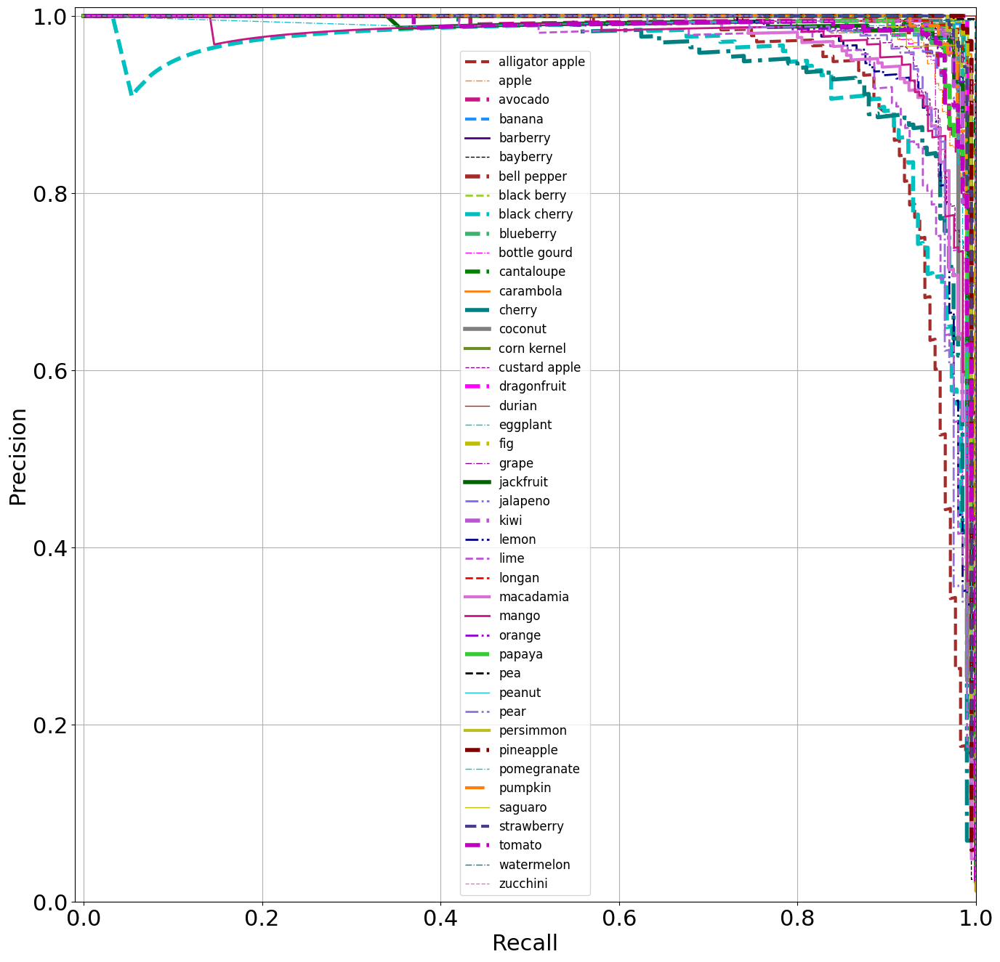

In [51]:
plt.figure(figsize=(16, 16))
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
# plt.plot([0, 1], [0, 1],ls="--", c='.3', linewidth=3, label='随机模型')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.rcParams['font.size'] = 22
plt.grid(True)

ap_list = []
for each_class in classes:
    y_test = list((df['category_name'] == each_class))
    y_score = list(df['{}-pred_confidence'.format(each_class)])
    precision, recall, thresholds = precision_recall_curve(y_test, y_score)
    AP = average_precision_score(y_test, y_score, average='weighted')
    plt.plot(recall, precision, **get_line_arg(), label=each_class)
    plt.legend()
    ap_list.append(AP)

plt.legend(loc='best', fontsize=12)
plt.savefig('category_PRcrue.pdf'.format(specific_class), dpi=600, bbox_inches='tight')
plt.show()

In [52]:
df_report = pd.read_csv('Accuracy by category.csv')
df_report

,category,precision,recall,f1-score,support,accuracy
0,alligator apple,0.897143,0.897143,0.897143,175.0,0.897143
1,apple,0.957447,0.937500,0.947368,240.0,0.937500
2,avocado,0.961207,0.957082,0.959140,233.0,0.957082
3,banana,0.982759,0.982759,0.982759,232.0,0.982759
4,barberry,0.966507,0.975845,0.971154,207.0,0.975845
5,bayberry,0.979592,0.964824,0.972152,199.0,0.964824
6,bell pepper,0.954774,0.950000,0.952381,200.0,0.950000
7,black berry,0.969565,0.991111,0.980220,225.0,0.991111
8,black cherry,0.907514,0.848649,0.877095,185.0,0.848649
9,blueberry,0.951456,0.980000,0.965517,200.0,0.980000


In [53]:
macro_avg_auc = np.mean(ap_list)
weighted_avg_auc = sum(ap_list * df_report.iloc[:-2]['support'] / len(df))
ap_list.append(macro_avg_auc)
ap_list.append(weighted_avg_auc)
df_report['AP'] = ap_list
df_report

,category,precision,recall,f1-score,support,accuracy,AP
0,alligator apple,0.897143,0.897143,0.897143,175.0,0.897143,0.949152
1,apple,0.957447,0.937500,0.947368,240.0,0.937500,0.988626
2,avocado,0.961207,0.957082,0.959140,233.0,0.957082,0.987333
3,banana,0.982759,0.982759,0.982759,232.0,0.982759,0.993192
4,barberry,0.966507,0.975845,0.971154,207.0,0.975845,0.994894
5,bayberry,0.979592,0.964824,0.972152,199.0,0.964824,0.991710
6,bell pepper,0.954774,0.950000,0.952381,200.0,0.950000,0.992431
7,black berry,0.969565,0.991111,0.980220,225.0,0.991111,0.996715
8,black cherry,0.907514,0.848649,0.877095,185.0,0.848649,0.941151
9,blueberry,0.951456,0.980000,0.965517,200.0,0.980000,0.993837


In [54]:
df_report.to_csv('Accuracy by category01.csv', index=False)

In [55]:
from matplotlib import colors as mcolors
import random
random.seed(124)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan', 'black', 'indianred', 'brown', 'firebrick', 'maroon', 'darkred', 'red', 'sienna', 'chocolate', 'yellow', 'olivedrab', 'yellowgreen', 'darkolivegreen', 'forestgreen', 'limegreen', 'darkgreen', 'green', 'lime', 'seagreen', 'mediumseagreen', 'darkslategray', 'darkslategrey', 'teal', 'darkcyan', 'dodgerblue', 'navy', 'darkblue', 'mediumblue', 'blue', 'slateblue', 'darkslateblue', 'mediumslateblue', 'mediumpurple', 'rebeccapurple', 'blueviolet', 'indigo', 'darkorchid', 'darkviolet', 'mediumorchid', 'purple', 'darkmagenta', 'fuchsia', 'magenta', 'orchid', 'mediumvioletred', 'deeppink', 'hotpink']
markers = [".",",","o","v","^","<",">","1","2","3","4","8","s","p","P","*","h","H","+","x","X","D","d","|","_",0,1,2,3,4,5,6,7,8,9,10,11]
linestyle = ['--', '-.', '-']
def get_line_arg():
    line_arg = {}
    line_arg['color'] = random.choice(colors)
    # line_arg['marker'] = random.choice(markers)
    line_arg['linestyle'] = random.choice(linestyle)
    line_arg['linewidth'] = random.randint(1, 4)
    # line_arg['markersize'] = random.randint(3, 5)
    return line_arg
get_line_arg()

{'color': 'seagreen', 'linestyle': '-', 'linewidth': 1}

In [56]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, threshold = roc_curve(y_test, y_score)

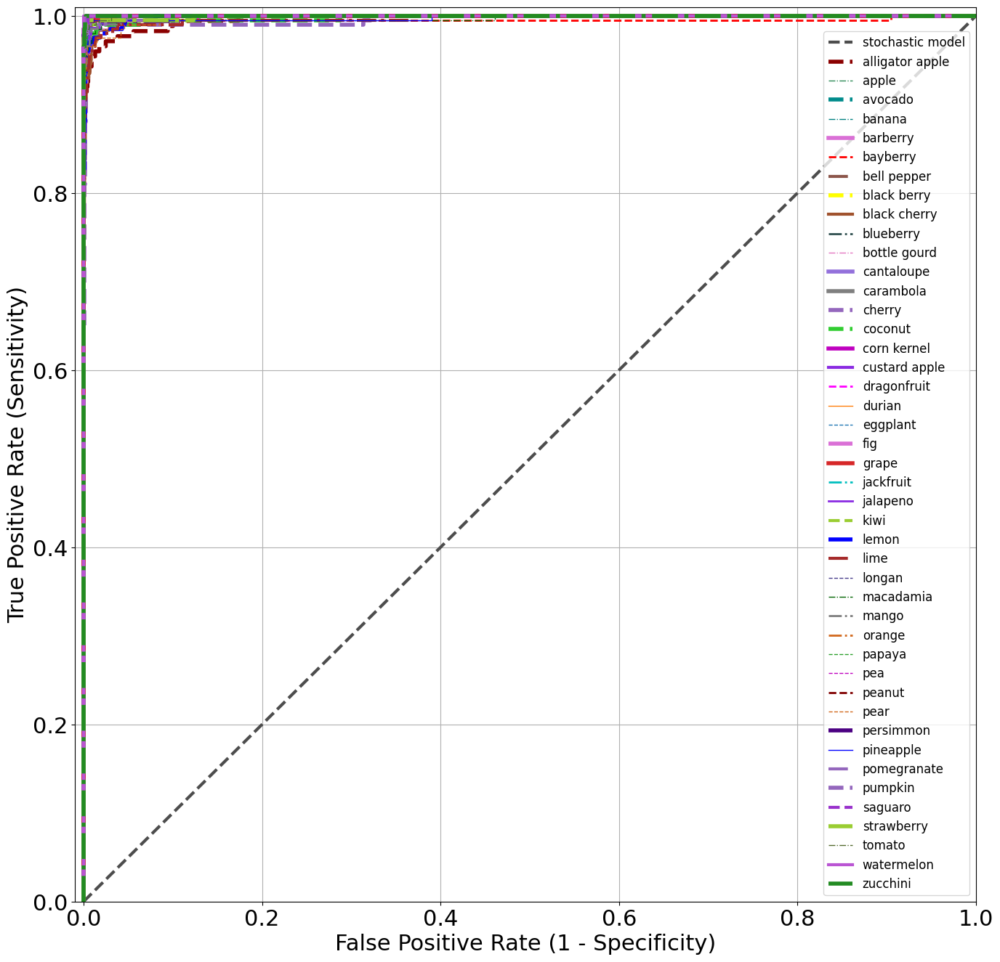

In [57]:
plt.figure(figsize=(16, 16))
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
plt.plot([0, 1], [0, 1],ls="--", c='.3', linewidth=3, label='stochastic model')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.rcParams['font.size'] = 22
plt.grid(True)

auc_list = []
for each_class in classes:
    y_test = list((df['category_name'] == each_class))
    y_score = list(df['{}-pred_confidence'.format(each_class)])
    fpr, tpr, threshold = roc_curve(y_test, y_score)
    plt.plot(fpr, tpr, **get_line_arg(), label=each_class)
    plt.legend()
    auc_list.append(auc(fpr, tpr))

plt.legend(loc='best', fontsize=12)
plt.savefig('category_ROCcrue.pdf'.format(specific_class), dpi=120, bbox_inches='tight')
plt.show()

In [58]:
df_report = pd.read_csv('Accuracy by category01.csv')
df_report

,category,precision,recall,f1-score,support,accuracy,AP
0,alligator apple,0.897143,0.897143,0.897143,175.0,0.897143,0.949152
1,apple,0.957447,0.937500,0.947368,240.0,0.937500,0.988626
2,avocado,0.961207,0.957082,0.959140,233.0,0.957082,0.987333
3,banana,0.982759,0.982759,0.982759,232.0,0.982759,0.993192
4,barberry,0.966507,0.975845,0.971154,207.0,0.975845,0.994894
5,bayberry,0.979592,0.964824,0.972152,199.0,0.964824,0.991710
6,bell pepper,0.954774,0.950000,0.952381,200.0,0.950000,0.992431
7,black berry,0.969565,0.991111,0.980220,225.0,0.991111,0.996715
8,black cherry,0.907514,0.848649,0.877095,185.0,0.848649,0.941151
9,blueberry,0.951456,0.980000,0.965517,200.0,0.980000,0.993837


In [59]:
macro_avg_auc = np.mean(auc_list)
weighted_avg_auc = sum(auc_list * df_report.iloc[:-2]['support'] / len(df))
auc_list.append(macro_avg_auc)
auc_list.append(weighted_avg_auc)
df_report['AUC'] = auc_list
df_report

,category,precision,recall,f1-score,support,accuracy,AP,AUC
0,alligator apple,0.897143,0.897143,0.897143,175.0,0.897143,0.949152,0.996600
1,apple,0.957447,0.937500,0.947368,240.0,0.937500,0.988626,0.999640
2,avocado,0.961207,0.957082,0.959140,233.0,0.957082,0.987333,0.999466
3,banana,0.982759,0.982759,0.982759,232.0,0.982759,0.993192,0.999066
4,barberry,0.966507,0.975845,0.971154,207.0,0.975845,0.994894,0.999769
5,bayberry,0.979592,0.964824,0.972152,199.0,0.964824,0.991710,0.995373
6,bell pepper,0.954774,0.950000,0.952381,200.0,0.950000,0.992431,0.999760
7,black berry,0.969565,0.991111,0.980220,225.0,0.991111,0.996715,0.999757
8,black cherry,0.907514,0.848649,0.877095,185.0,0.848649,0.941151,0.998179
9,blueberry,0.951456,0.980000,0.965517,200.0,0.980000,0.993837,0.999863


In [60]:
df_report.to_csv('Accuracy by category01.csv', index=False)

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [62]:
df = pd.read_csv('Accuracy by category01.csv')
df

,category,precision,recall,f1-score,support,accuracy,AP,AUC
0,alligator apple,0.897143,0.897143,0.897143,175.0,0.897143,0.949152,0.996600
1,apple,0.957447,0.937500,0.947368,240.0,0.937500,0.988626,0.999640
2,avocado,0.961207,0.957082,0.959140,233.0,0.957082,0.987333,0.999466
3,banana,0.982759,0.982759,0.982759,232.0,0.982759,0.993192,0.999066
4,barberry,0.966507,0.975845,0.971154,207.0,0.975845,0.994894,0.999769
5,bayberry,0.979592,0.964824,0.972152,199.0,0.964824,0.991710,0.995373
6,bell pepper,0.954774,0.950000,0.952381,200.0,0.950000,0.992431,0.999760
7,black berry,0.969565,0.991111,0.980220,225.0,0.991111,0.996715,0.999757
8,black cherry,0.907514,0.848649,0.877095,185.0,0.848649,0.941151,0.998179
9,blueberry,0.951456,0.980000,0.965517,200.0,0.980000,0.993837,0.999863


In [63]:
# feature = 'precision'
feature = 'recall'
# feature = 'f1-score'
# feature = 'accuracy'
# feature = 'AP'
# feature = 'AUC'

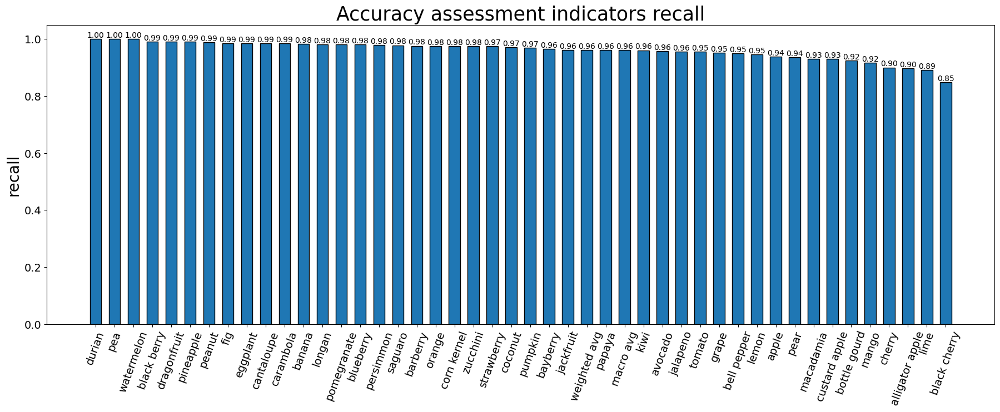

In [64]:
df_plot = df.sort_values(by=feature, ascending=False)

plt.figure(figsize=(22, 7))

x = df_plot['category']
y = df_plot[feature]

ax = plt.bar(x, y, width=0.6, facecolor='#1f77b4', edgecolor='k')
plt.bar_label(ax, fmt='%.2f', fontsize=10) 

plt.xticks(rotation=70)
plt.tick_params(labelsize=14)
# plt.xlabel('类别', fontsize=20)
plt.ylabel(feature, fontsize=20)
plt.title('Accuracy assessment indicators {}'.format(feature), fontsize=25)

plt.savefig('Accuracy Assessment Bar Chart-{}.pdf'.format(feature), dpi=600, bbox_inches='tight')

plt.show()